<a href="https://colab.research.google.com/github/ABHI2410/ComputerVision/blob/main/PA3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CSE 6367 Programming Assignment 3 (P3)

## Summer 2023

## Eigenfaces (100 points)

In [74]:
!gdown https://drive.google.com/uc?id=15SNnm-MMkC6anecM8WWo-sCjweOUCg_F
!unzip Eigenfaces.zip

Downloading...
From: https://drive.google.com/uc?id=15SNnm-MMkC6anecM8WWo-sCjweOUCg_F
To: /content/Eigenfaces.zip
100% 2.04M/2.04M [00:00<00:00, 86.6MB/s]
Archive:  Eigenfaces.zip
replace Eigenfaces/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: Eigenfaces/.DS_Store    
  inflating: Eigenfaces/Test/.DS_Store  
  inflating: Eigenfaces/Test/S034_005_02293928.jpg  
  inflating: Eigenfaces/Test/S035_005_02500507.jpg  
  inflating: Eigenfaces/Test/S045_001_00155520.jpg  
  inflating: Eigenfaces/Test/S046_004_00021029.jpg  
  inflating: Eigenfaces/Test/S050_003_00015829.jpg  
  inflating: Eigenfaces/Test/S053_001_00022401.jpg  
  inflating: Eigenfaces/Test/S054_001_00021023.jpg  
  inflating: Eigenfaces/Test/S055_005_01065417.jpg  
  inflating: Eigenfaces/Test/S056_001_01175021.jpg  
  inflating: Eigenfaces/Test/S057_006_01271600.jpg  
  inflating: Eigenfaces/Test/S059_002_00121512.jpg  
  inflating: Eigenfaces/Test/S060_001_00211719.jpg  
  inflating: Eigenfaces/Test/S063_0

In [75]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
from tqdm import tqdm
from google.colab.patches import cv2_imshow

### Task1 (30 points)
1. Load all the 25 images in the "/Eigenfaces/Train"
2. Display all the original faces in a 5X5 grid. Resize the images to 100X100 pixels for display only.
3. Find the mean face image. Perform PCA on the training faces.
4. Display the mean face. Resize the mean face to 100X100 pixels for display only
5. Diplay all the eigenfaces in a 5X5 grid.

In [76]:
def show_images(images, num_cols=5):
    num_rows = len(images) // num_cols + (1 if len(images) % num_cols != 0 else 0)
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 10))
    fig.subplots_adjust(hspace=0.5)
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i], cmap='gray')
            ax.set_xticks([])
            ax.set_yticks([])
        else:
            ax.axis('off')

In [77]:
def load_images_from_folder(folder_path):
    images = []
    for filename in os.listdir(folder_path):
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img)
    return images

def resize_images(images, width, height):
    resized_images = [cv2.resize(img, (width, height)) for img in images]
    return resized_images


images_folder_path = "./Eigenfaces/Train"
images = load_images_from_folder(images_folder_path)


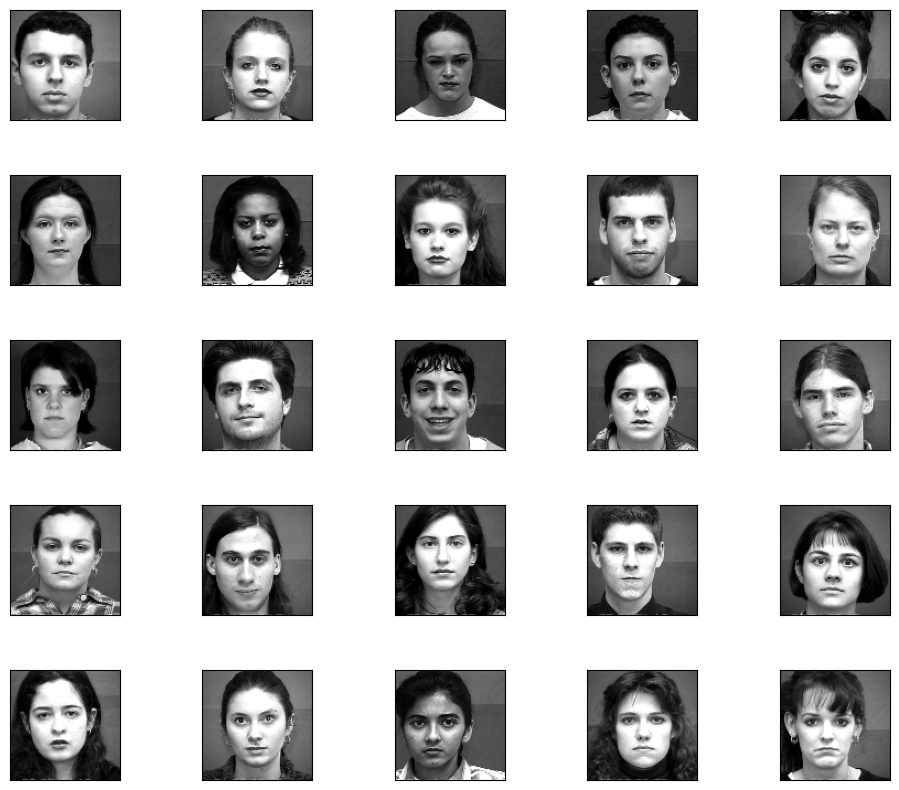

In [78]:
resized_images = resize_images(images, 100, 100)
flat_images = [img.flatten() for img in resized_images]
show_images(resized_images)

In [79]:

def compute_mean(images):
    num_images = len(images)
    height, width = images[0].shape[:2]
    mean_image = np.zeros((height, width), dtype=np.float64)
    for img in images:
        mean_image += img / num_images
    return mean_image

def center_data(images, mean_image):
    centered_data = [img - mean_image for img in images]
    return centered_data

def compute_covariance_matrix(centered_data):
    num_images = len(centered_data)
    height, width = centered_data[0].shape[:2]
    cov_matrix = np.zeros((height * width, height * width), dtype=np.float64)
    for img in centered_data:
        img_flat = img.ravel()
        cov_matrix += np.outer(img_flat, img_flat)
    cov_matrix /= (num_images - 1)
    return cov_matrix

mean_face = compute_mean(resized_images)

centered_data = center_data(resized_images, mean_face)
covariance_matrix = compute_covariance_matrix(centered_data)

num_eigenfaces = 24
eigenvalues, eigenvectors = np.linalg.eigh(covariance_matrix)
sorted_indices = np.argsort(eigenvalues)[::-1]
top_eigenvectors = eigenvectors[:, sorted_indices[:num_eigenfaces]]

(-0.5, 99.5, 99.5, -0.5)

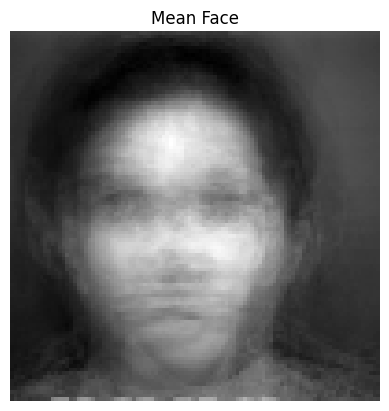

In [80]:
plt.figure()
plt.imshow(mean_face, cmap='gray')
plt.title('Mean Face')
plt.axis('off')

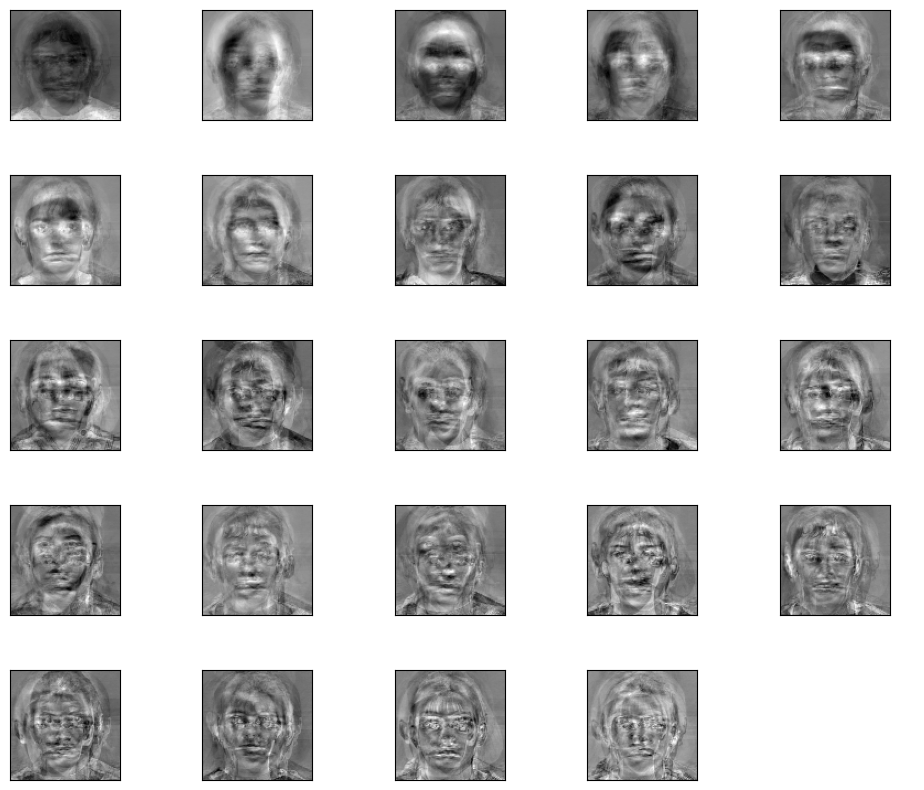

In [81]:
eigenface_images = [eigenface.reshape(100, 100) for eigenface in top_eigenvectors.T]
show_images(eigenface_images)

### Task2 (30 points)

1. Select k = 2 eigenfaces (eigenvectors that correspond to the largest eigenvalues).
2. Reconstruct the training faces and display the reconstructed faces in a 5X5 grid.
3. Repeat the process for k = 5 and k = 15. For each k, reconstruct the training faces and display the reconstructed image in a 5X5 grid.

<Figure size 640x480 with 0 Axes>

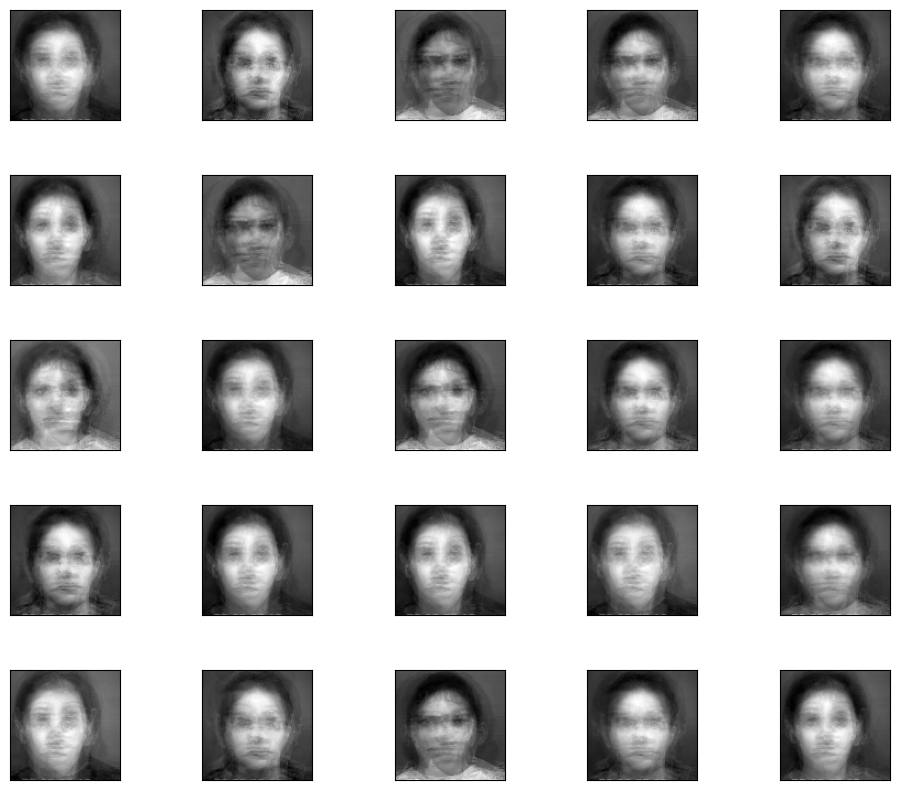

<Figure size 640x480 with 0 Axes>

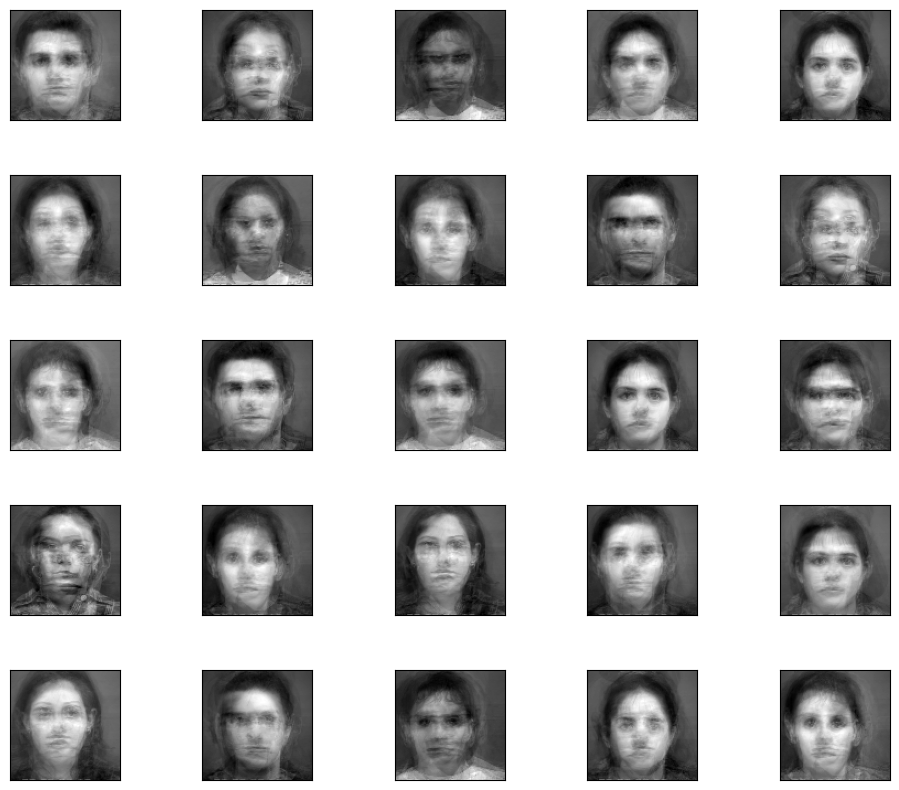

<Figure size 640x480 with 0 Axes>

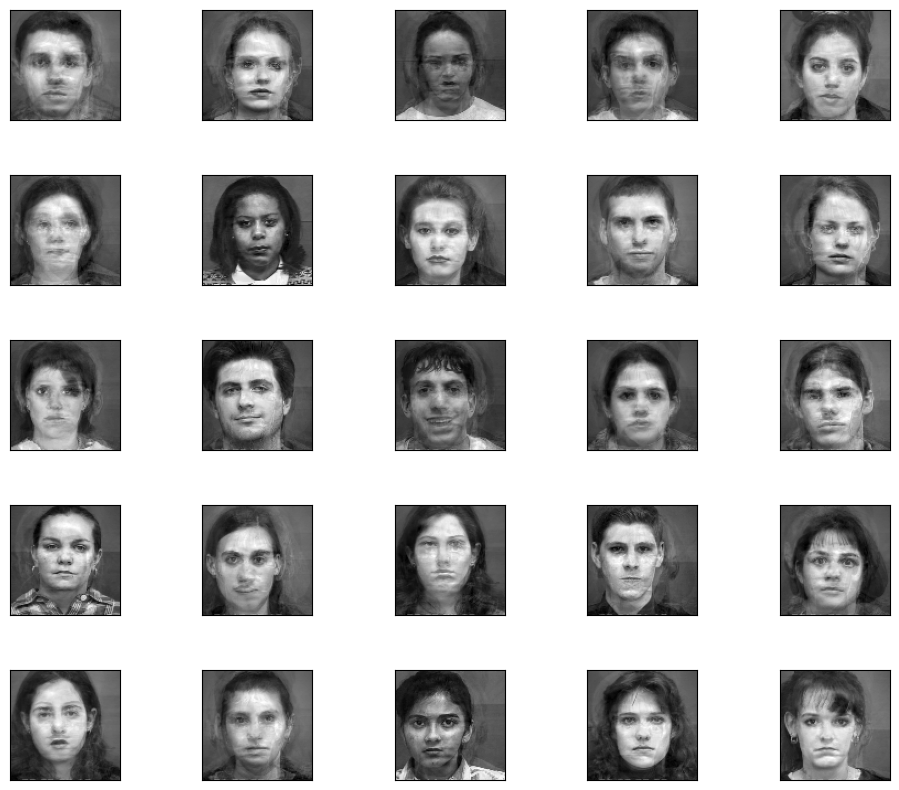

In [106]:

def reconstruct_faces_k(centered_data, eigenfaces, k, mean_face):
    reconstructed_faces = []
    for img in centered_data:
        img_flat = img.ravel()
        weights = np.dot(img_flat, eigenfaces[:, :k])
        reconstructed_img = np.dot(weights, eigenfaces[:, :k].T)
        reconstructed_img = mean_face + reconstructed_img.reshape(img.shape)
        reconstructed_faces.append(reconstructed_img)
    return weights ,reconstructed_faces


def show_reconstructed_faces(reconstructed_faces, k):
    plt.figure()
    plt.suptitle(f'Reconstructed Faces with k = {k}', fontsize=16)
    show_images(reconstructed_faces)

k_values = [2, 5, 15]
weight_train =[[],[],[]]
for k in k_values:
    sorted_indices = np.argsort(eigenvalues)[::-1]
    top_eigenvectors_k = eigenvectors[:, sorted_indices[:k]]

    weight, reconstructed_faces_k = reconstruct_faces_k(centered_data, top_eigenvectors_k, k, mean_face)
    if k ==2 :
        weight_train[0].append(weight)
    if k ==5 :
        weight_train[1].append(weight)
    if k ==15 :
        weight_train[2].append(weight)

    show_reconstructed_faces(reconstructed_faces_k, k)

plt.show()

### Task3 (40 points)
1. Load all the test images from "/Eigenfaces/Test"
2. Project each image on the k = 2 eigenvectors and find if it's a face. If it's a face, find it's closest training image. Use euclidean distance to calculate distance.
3. Display all the results in an M X 2 table, where M is total no of test images. Each row of the table displays two images. The image on the left is the test image. The image on the right is it's closest image in the eigenfaces space. If an image is classified as a non-face, then the second column in the table should be blank.
4. Repeat the process and display the results for k = 5, k = 15.

8968.590346240328


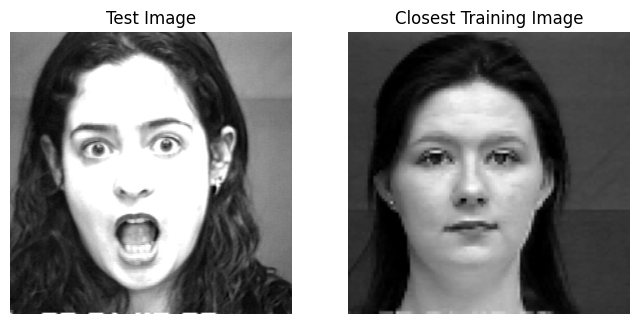

10082.720503016506


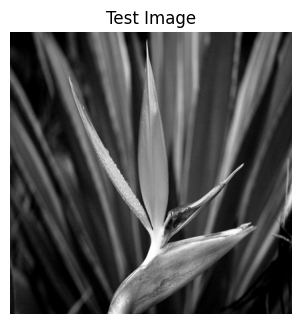

9380.972200361817


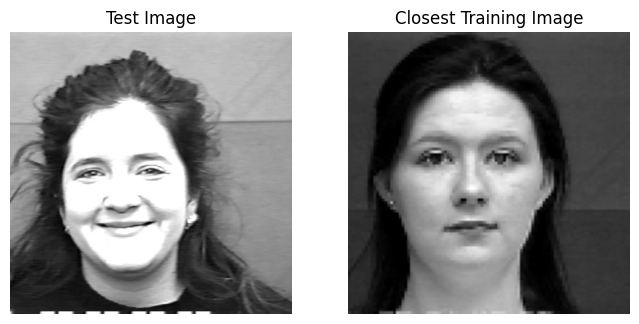

9173.623782891746


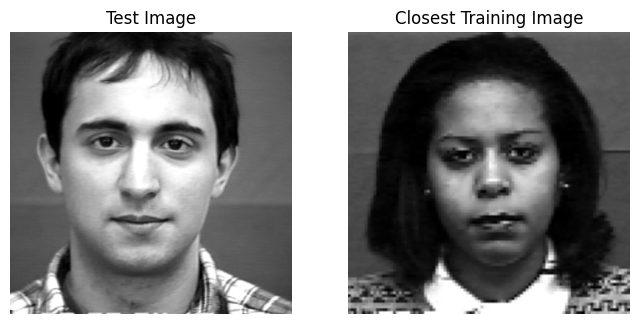

9709.739368475111


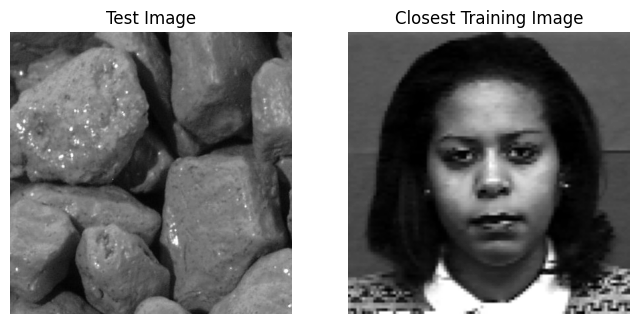

10322.599978838687


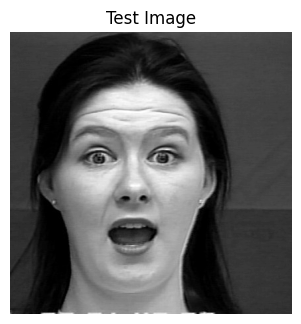

9906.942703850242


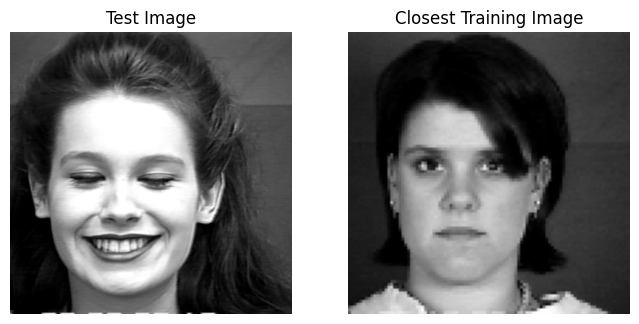

9127.209485330948


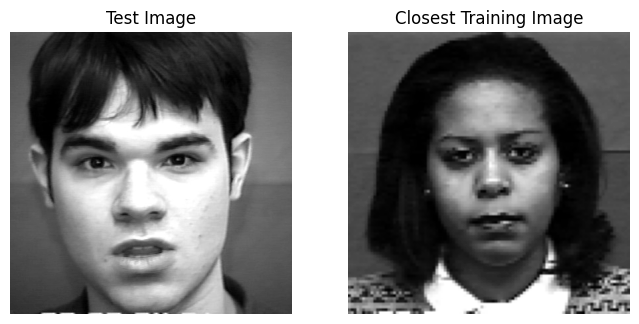

8693.03762252555


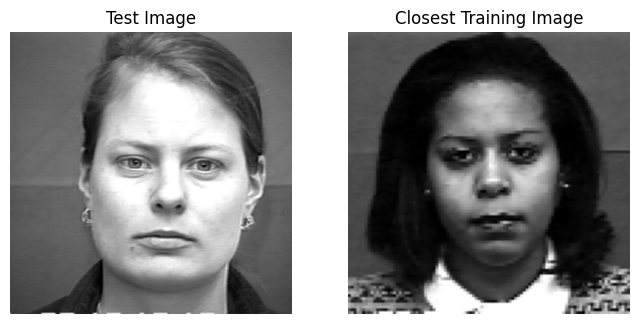

9142.999692939738


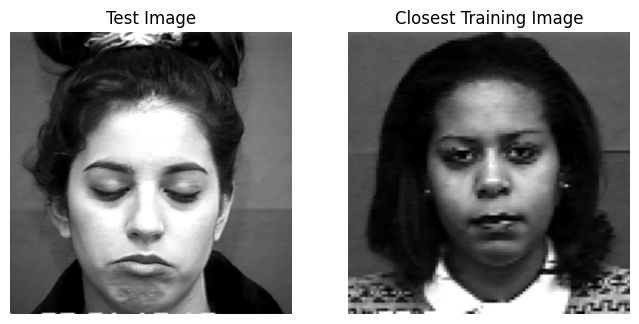

9752.89049040549


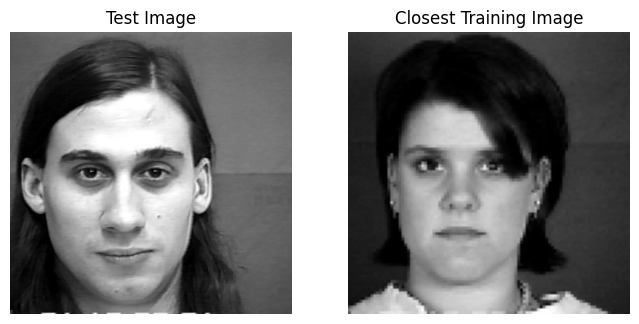

9696.321093358583


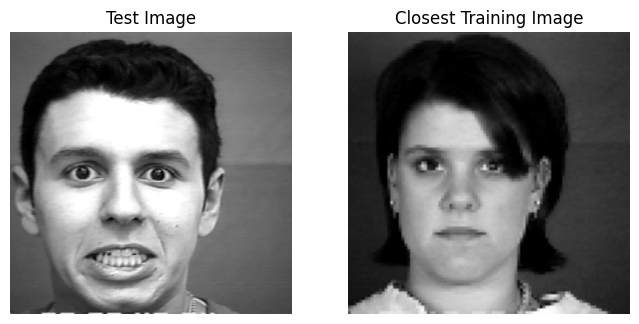

8770.44665912952


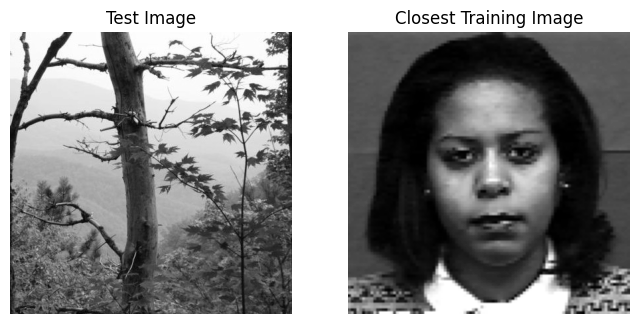

9071.738935837473


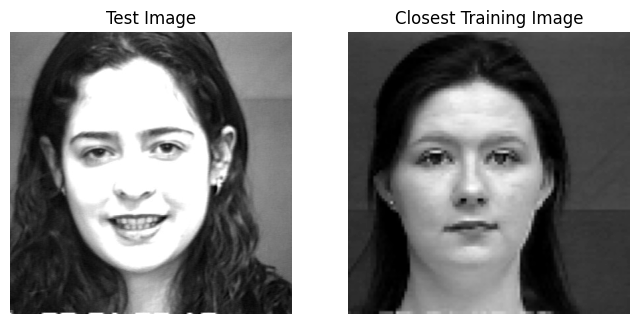

9083.303502058932


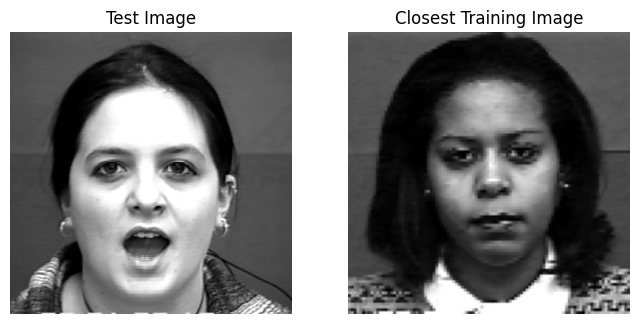

8839.840138354792


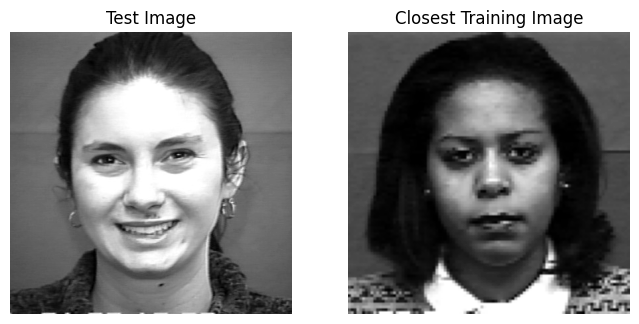

9960.135405446941


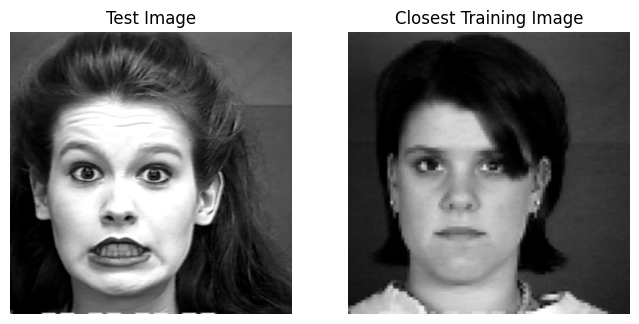

9706.090694294839


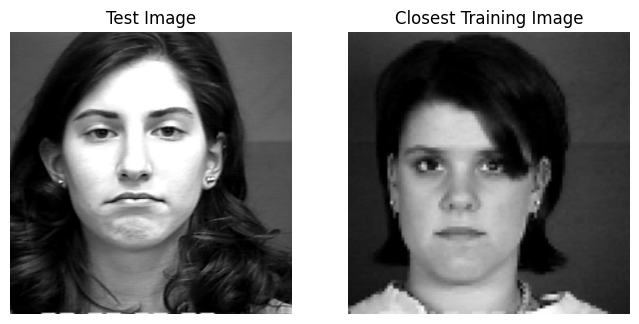

9295.497767768855


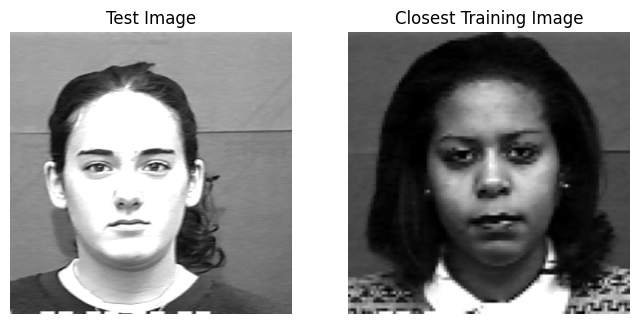

9406.395691578733


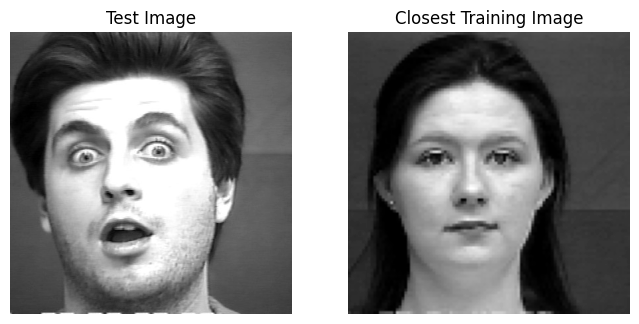

10028.383127507017


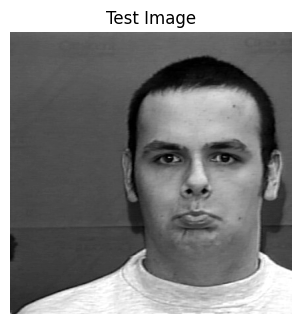

9203.404971383447


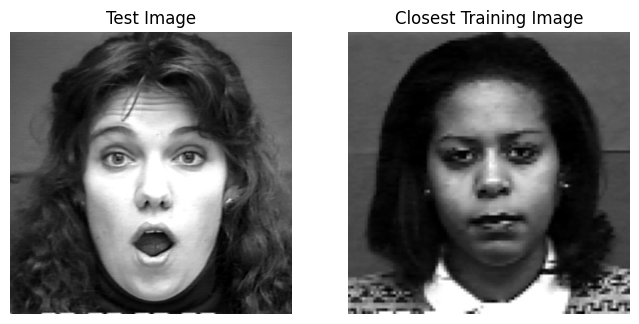

9129.000366802817


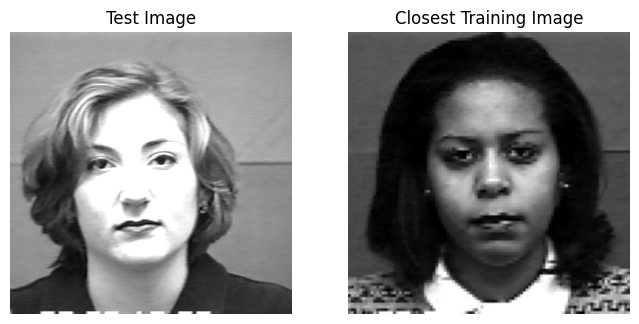

8660.582827509645


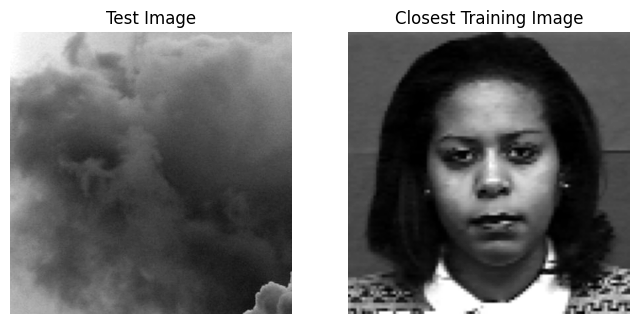

9180.976352592312


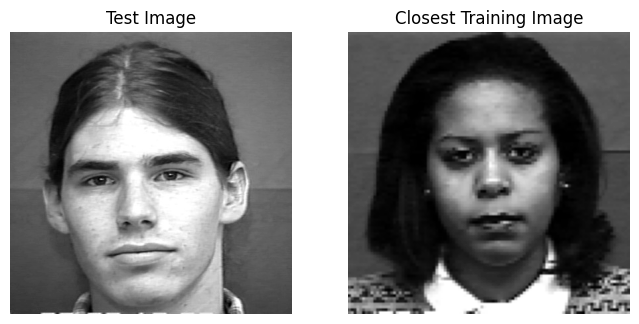

10114.152329327111


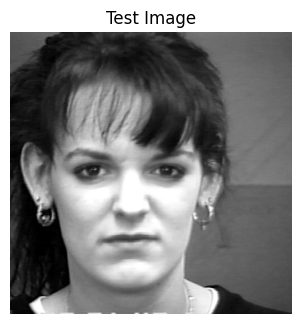

10192.489783046838


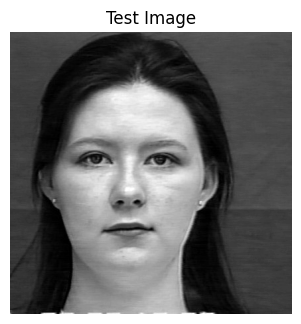

8880.613436947027


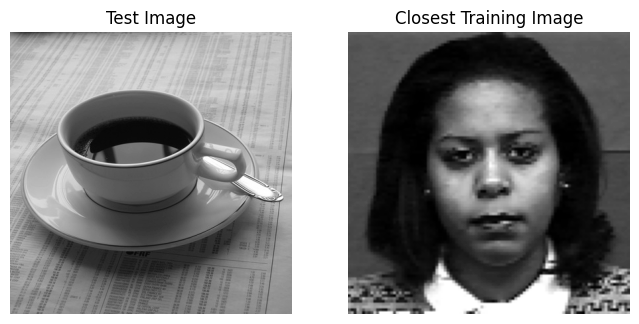

9796.703832287007


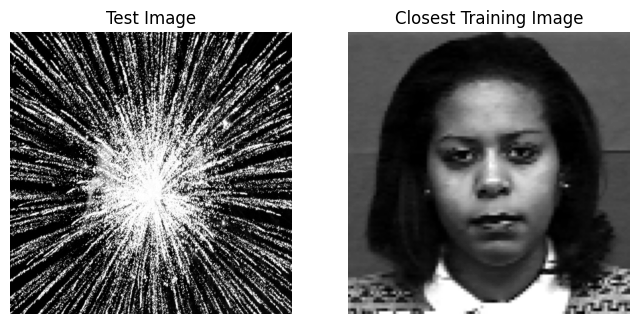

8768.084314774265


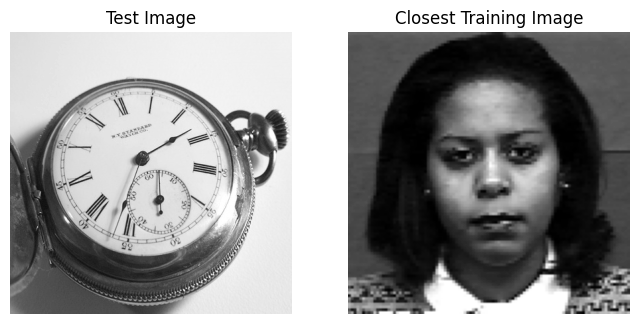

8648.45486036469


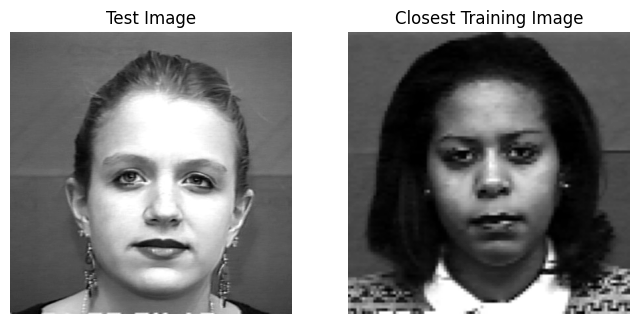

9688.189402632615


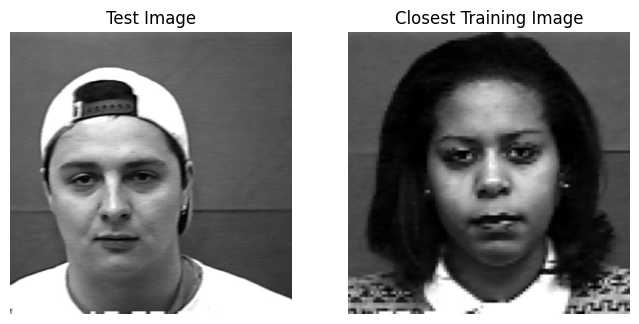

In [116]:
test_images_path = "./Eigenfaces/Test"
test_images = []
for filename in os.listdir(test_images_path):
    if filename.endswith(".jpg"):
        img_path = os.path.join(test_images_path, filename)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        test_images.append(img)



def project_on_eigenvectors(image, mean_face, eigenvectors, k):
    image = cv2.resize(image,(100,100))
    img_flat = image.ravel()
    centered_image = img_flat - mean_face.ravel()
    weights = np.dot(centered_image, eigenvectors[:, :k])
    reconstructed_image = np.dot(weights, eigenvectors[:, :k].T)
    reconstructed_image = reconstructed_image.reshape(100,100)
    return weights, reconstructed_image

def calculate_distance(feature_vector, training_features):
    return np.linalg.norm(training_features - feature_vector, axis=1)

def find_closest_image(test_image, train_images):
    min_distance = float("inf")
    closest_image = None
    for i, train_image in enumerate(train_images):
        distance = np.linalg.norm(test_image - train_image)
        if distance < min_distance:
            min_distance = distance
            closest_image = train_image
    print(min_distance)
    if min_distance > 10000:
        return None
    else:
        return closest_image


k = 2

results_table = []
for i, test_image in enumerate(test_images):
    sorted_indices = np.argsort(eigenvalues)[::-1]
    top_eigenvectors_k = eigenvectors[:, sorted_indices[:k]]
    weights, reconstructed_image = project_on_eigenvectors(test_image, mean_face, top_eigenvectors_k, k)
    closest_image = find_closest_image(reconstructed_image, resized_images)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(test_image, cmap="gray")
    plt.title("Test Image")
    plt.axis("off")
    if closest_image is not None:
        plt.subplot(1, 2, 2)
        plt.imshow(closest_image.reshape(100, 100), cmap="gray")
        plt.title("Closest Training Image")
        plt.axis("off")

    plt.show()


9460.972936286282


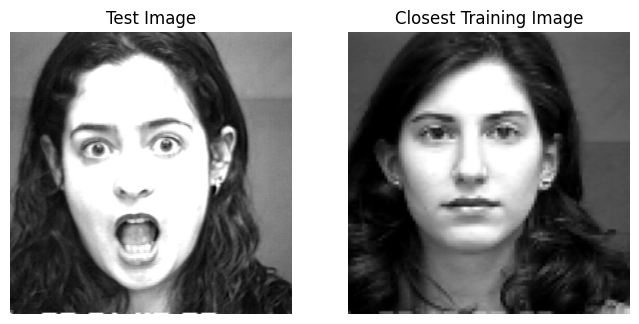

10423.426355748375


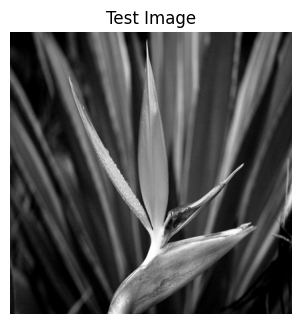

9060.429662704148


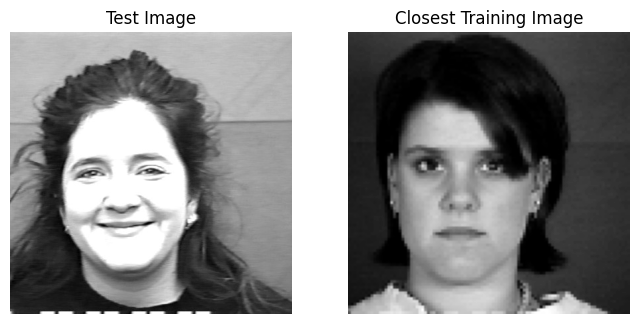

9270.027561362043


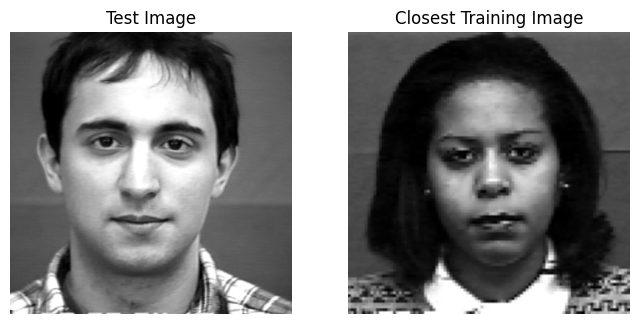

9713.858326499116


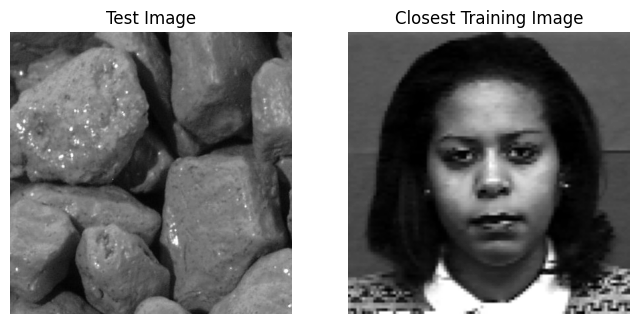

11133.572118423515


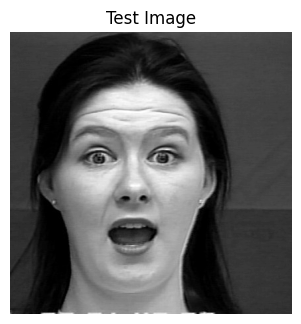

9680.617499691933


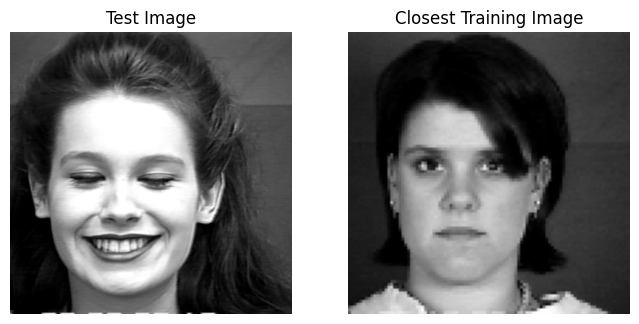

9285.131301217807


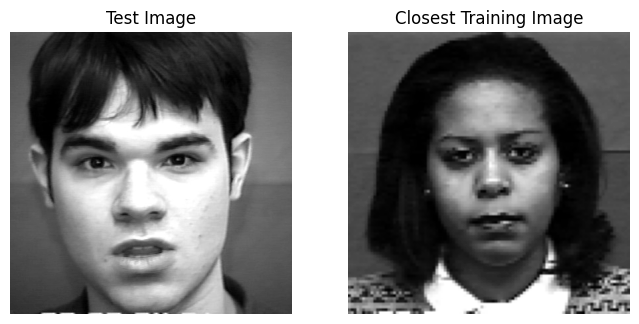

8645.250866144386


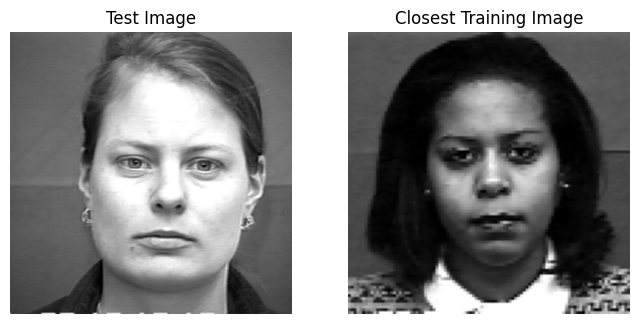

10022.326042855064


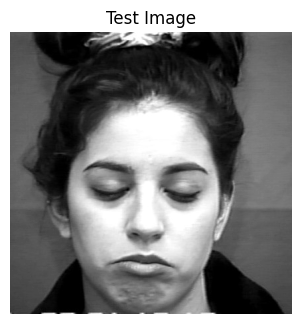

9125.257458717599


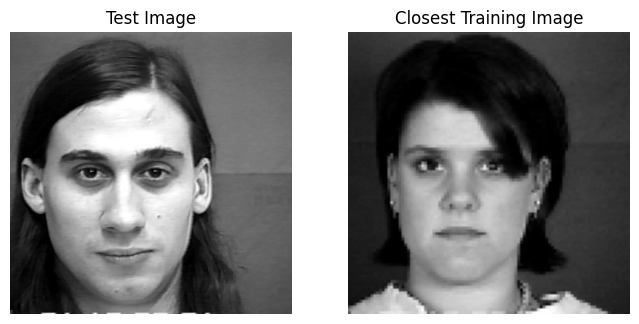

8766.355210829312


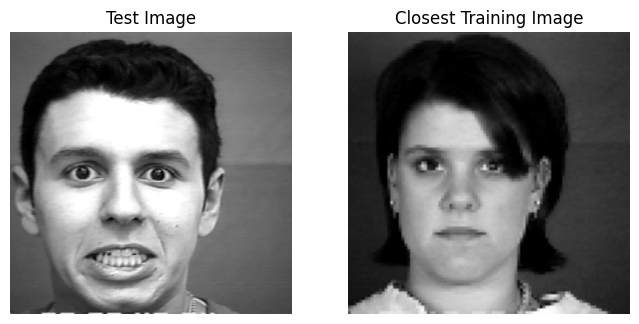

8946.591338233096


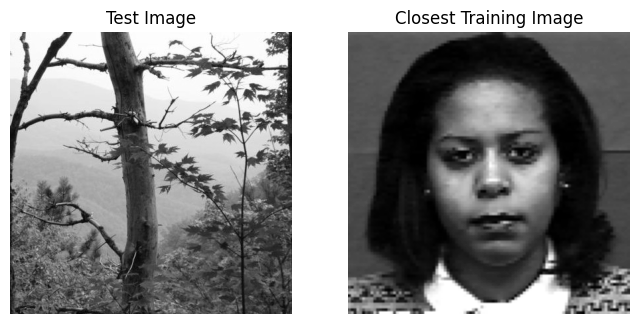

9696.05692384618


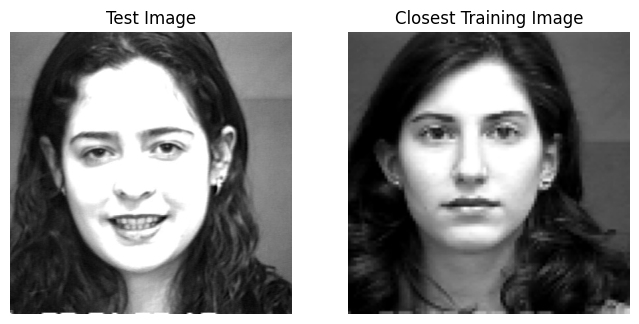

9598.089349388652


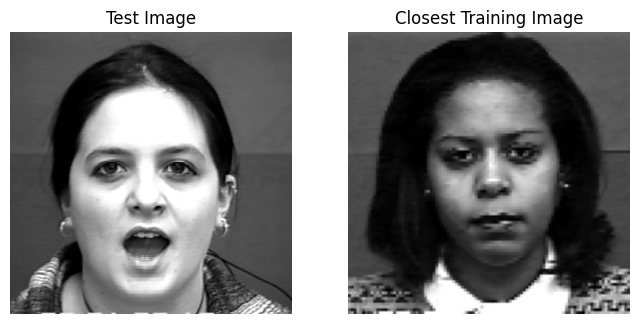

8794.220868796318


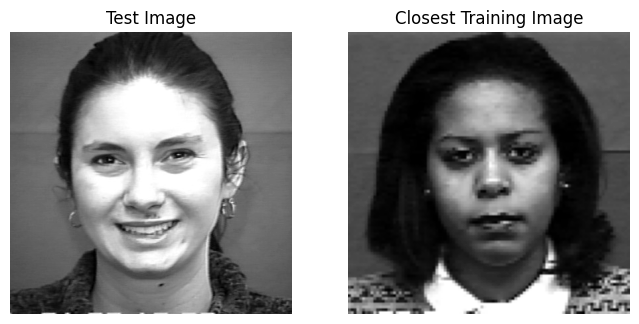

9578.876884364547


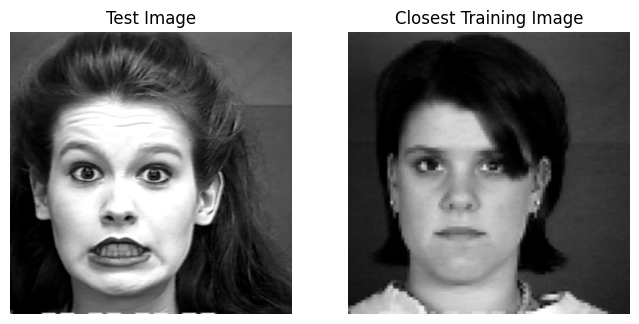

11391.882883197504


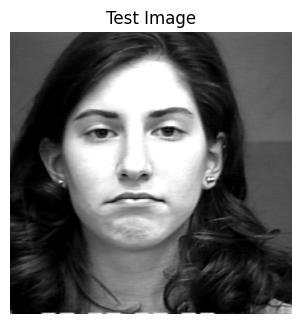

8867.58248276086


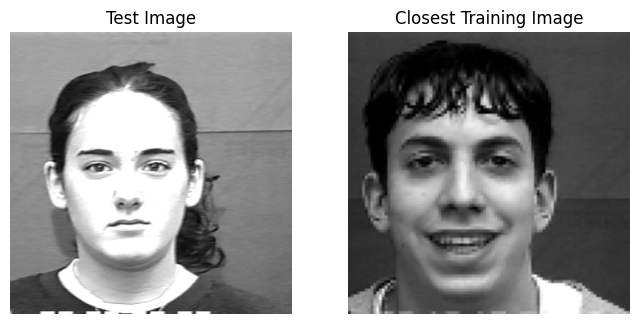

9287.279252616765


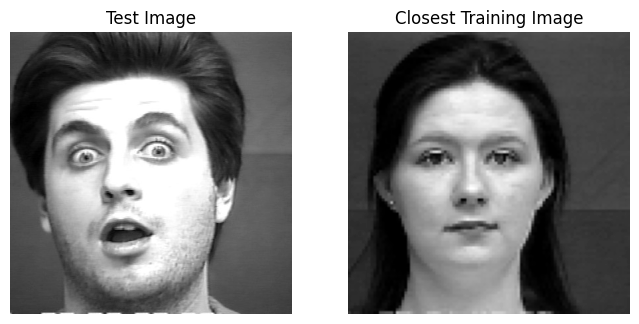

10045.248961263642


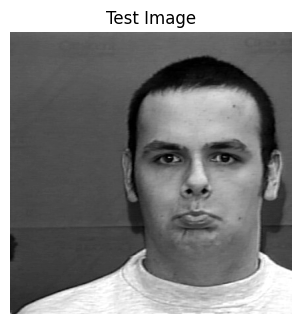

9957.47778531993


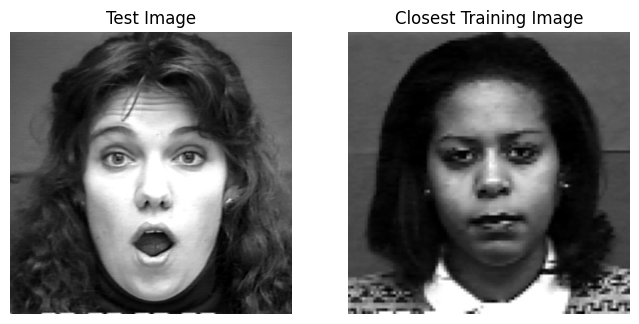

9325.534929639089


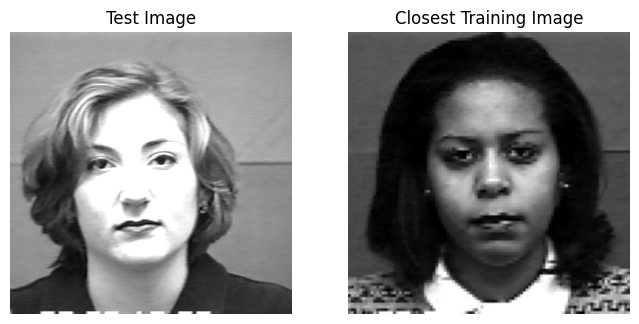

8899.316074747792


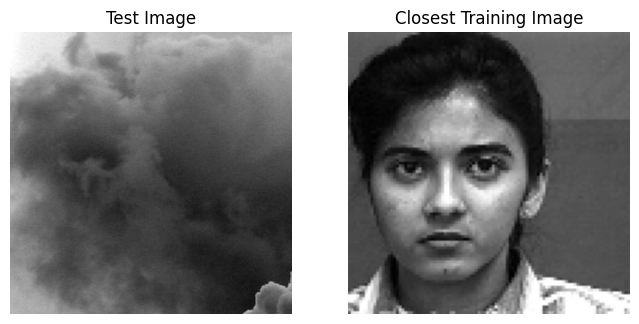

9476.023670931092


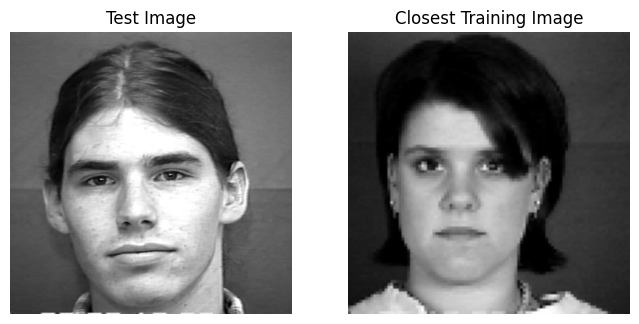

9321.467454790865


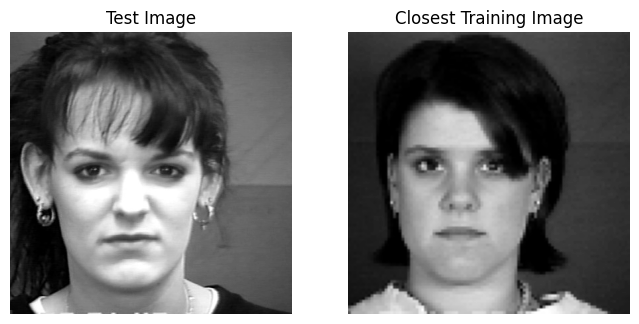

10679.134278546413


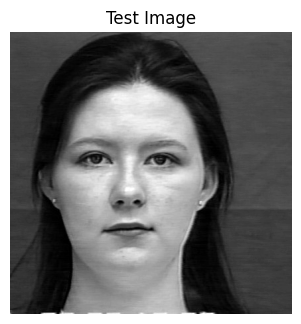

9663.446363761595


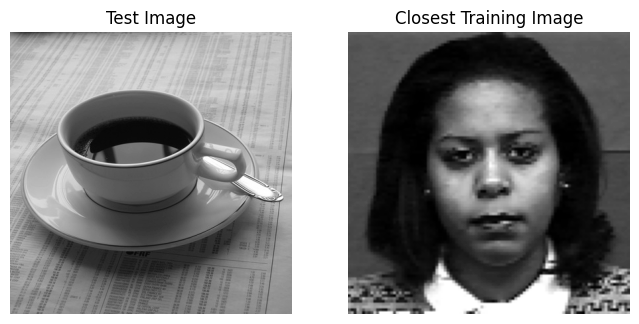

10213.527214522415


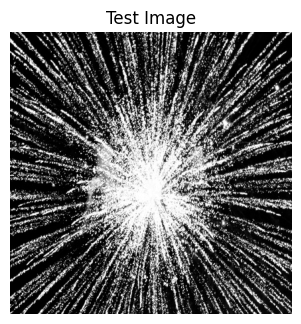

9275.642555266837


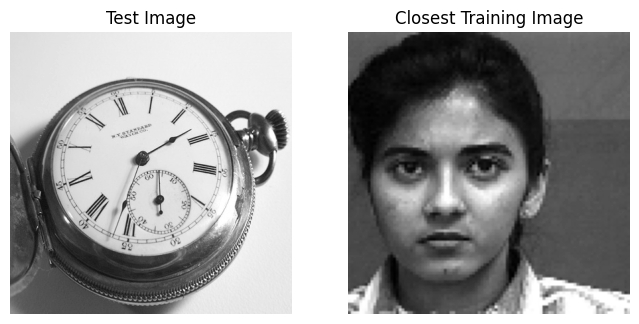

8804.317888053754


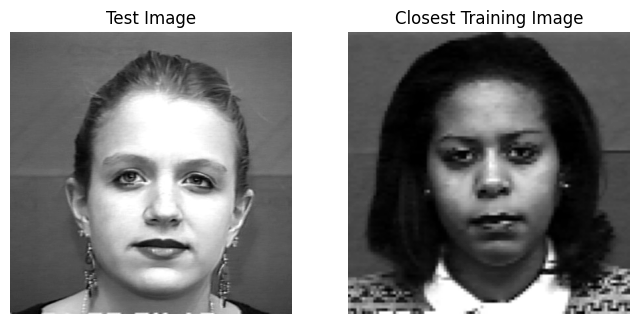

9771.54602702251


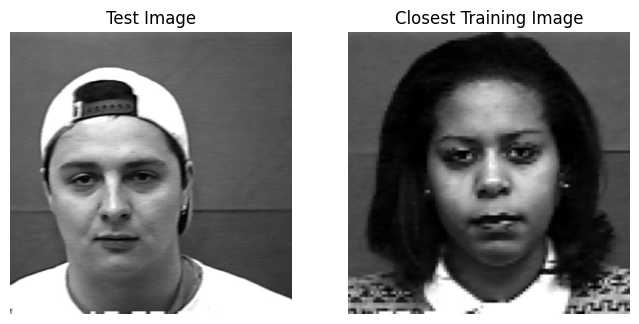

In [118]:
k = 5


results_table = []
for i, test_image in enumerate(test_images):
    sorted_indices = np.argsort(eigenvalues)[::-1]
    top_eigenvectors_k = eigenvectors[:, sorted_indices[:k]]
    weights, reconstructed_image = project_on_eigenvectors(test_image, mean_face, top_eigenvectors_k, k)
    closest_image = find_closest_image(reconstructed_image, resized_images)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(test_image, cmap="gray")
    plt.title("Test Image")
    plt.axis("off")
    if closest_image is not None:
        plt.subplot(1, 2, 2)
        plt.imshow(closest_image.reshape(100, 100), cmap="gray")
        plt.title("Closest Training Image")
        plt.axis("off")

    plt.show()


9262.986651624247


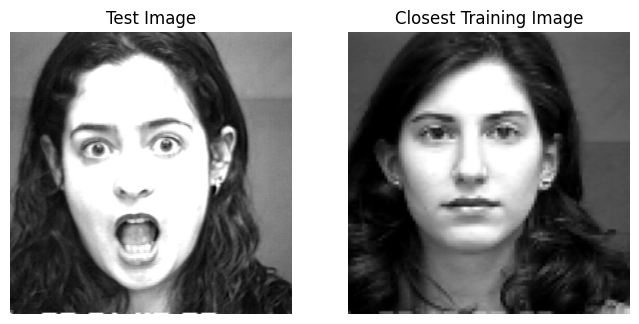

11114.804429152831


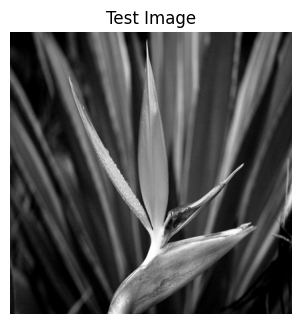

9730.189178930046


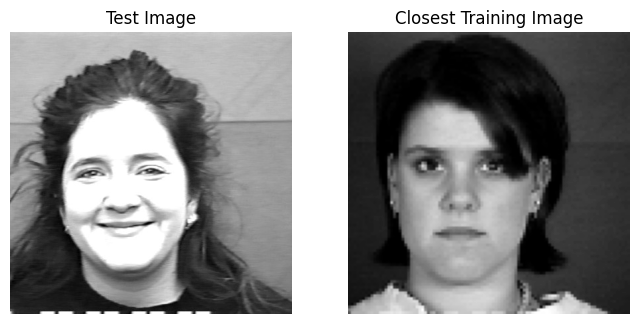

9326.269774418983


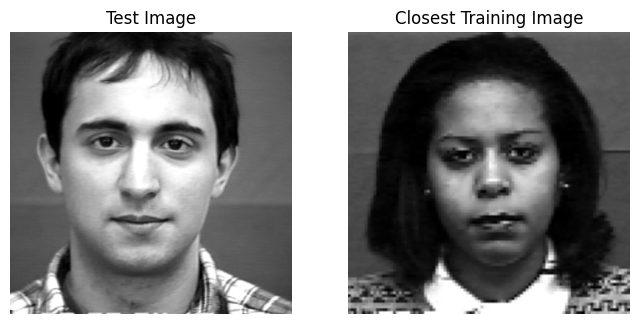

9864.053927302932


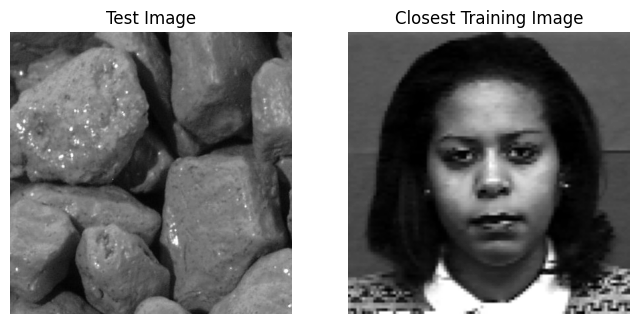

11132.24964502427


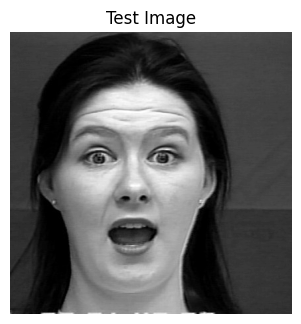

10340.716777775102


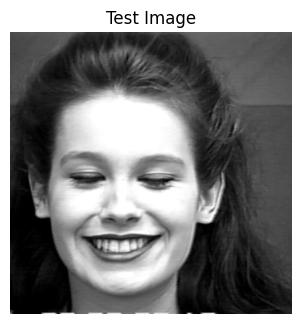

9522.753848139155


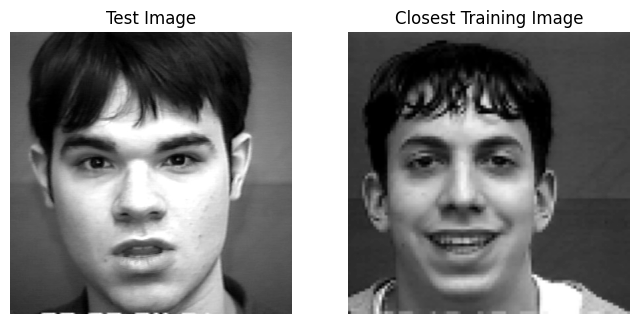

9413.369301257155


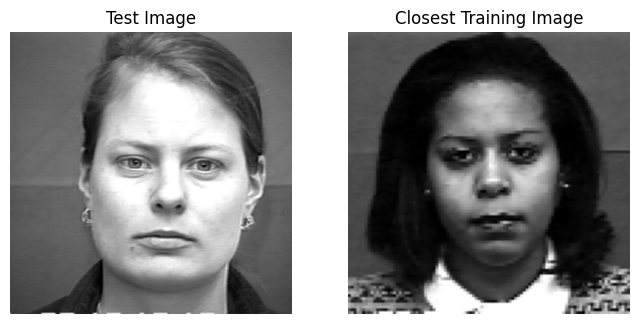

10336.264285778212


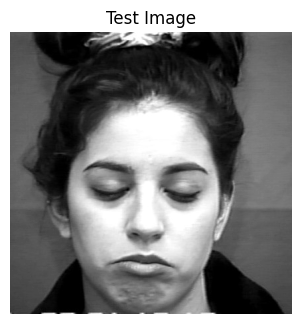

10047.237087073485


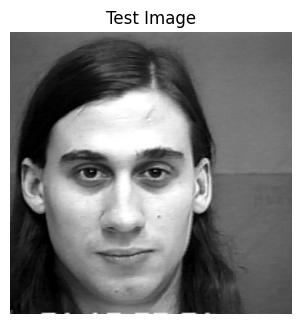

8912.176271853948


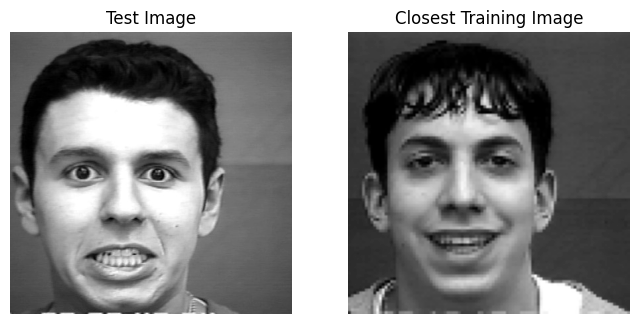

8878.724957769697


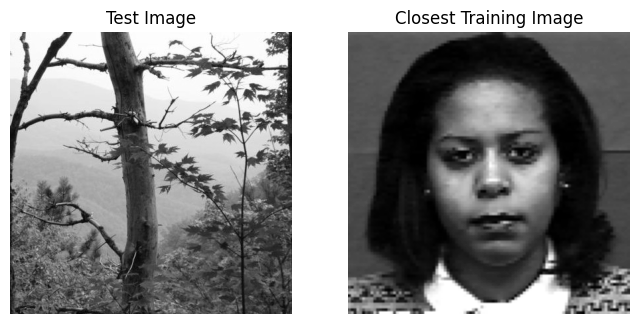

9532.124878023575


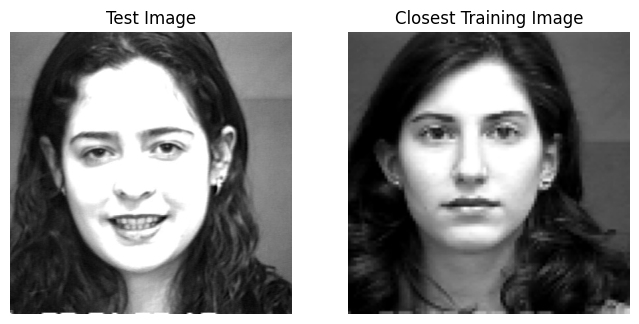

9507.266037459274


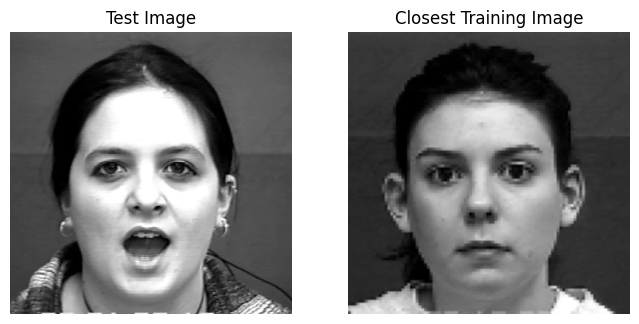

8572.863079833096


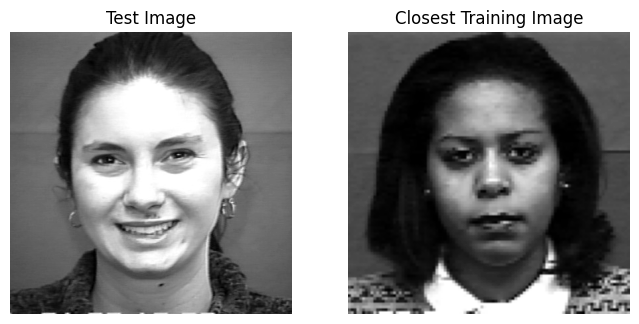

10318.213746585308


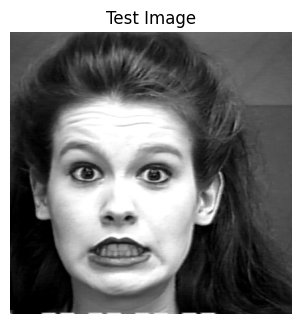

11245.410095488276


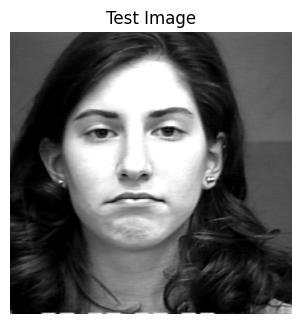

9072.344302589543


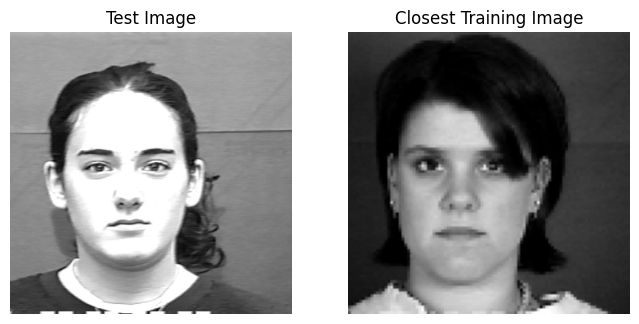

9312.610979705285


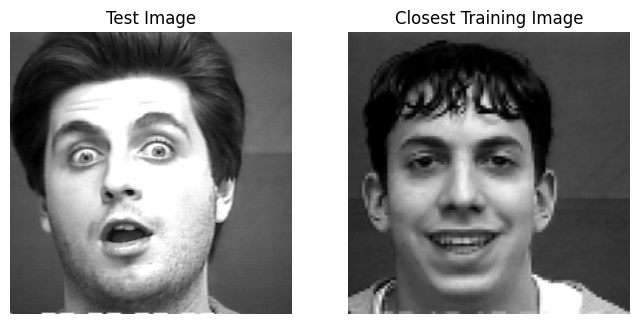

9862.620257723174


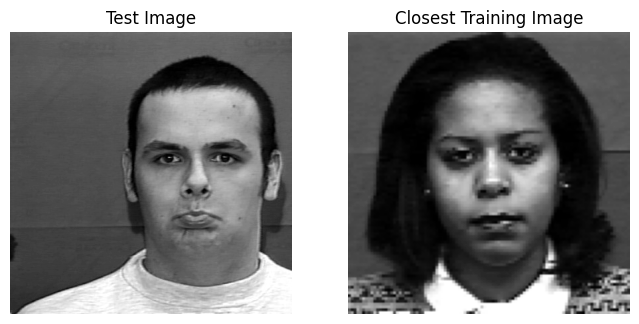

10861.59770186819


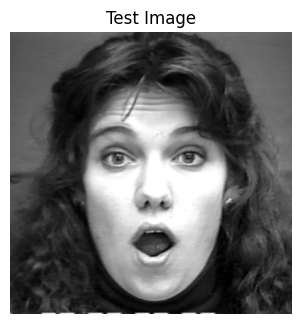

9076.808779377316


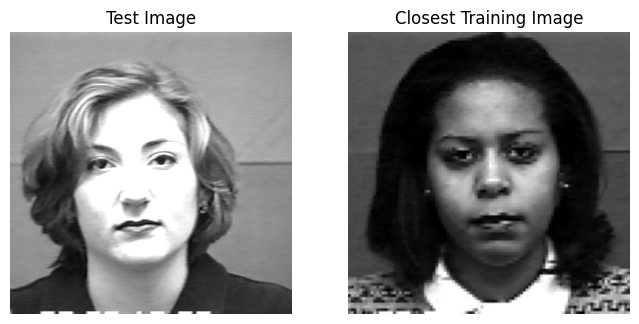

8820.375144234315


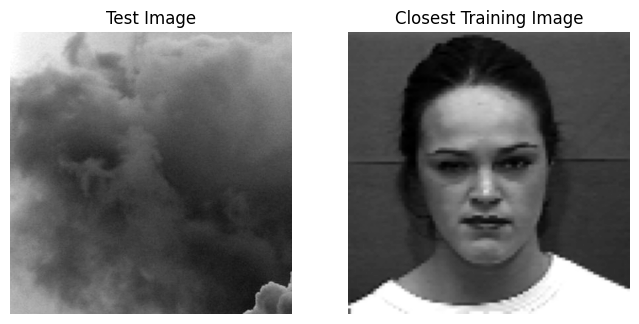

9464.370421148855


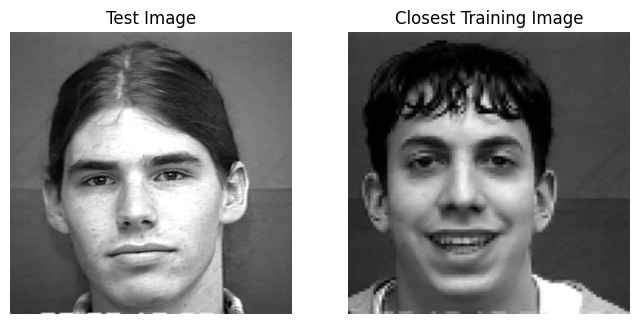

9201.608318736868


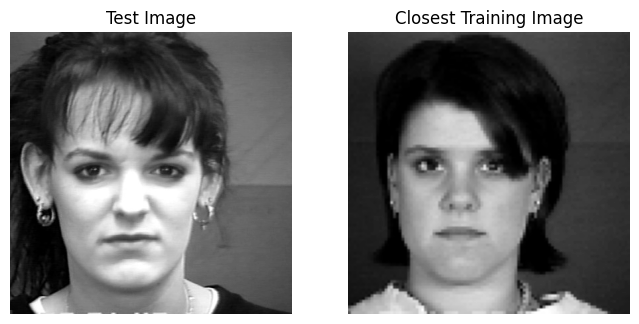

10687.764790425861


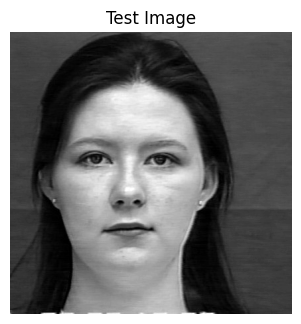

9707.28092485058


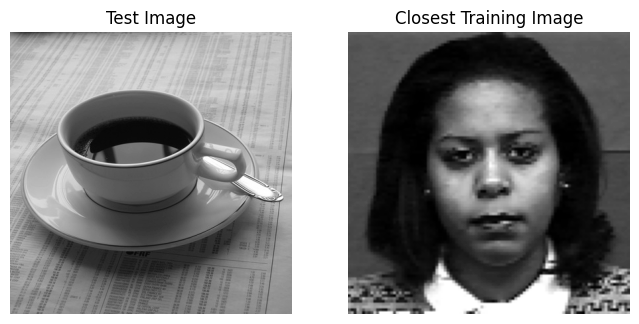

10892.739981481789


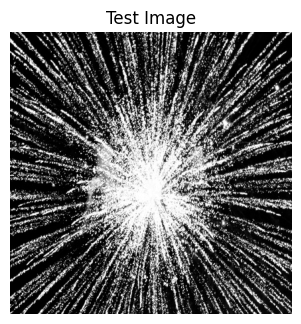

9097.173099348696


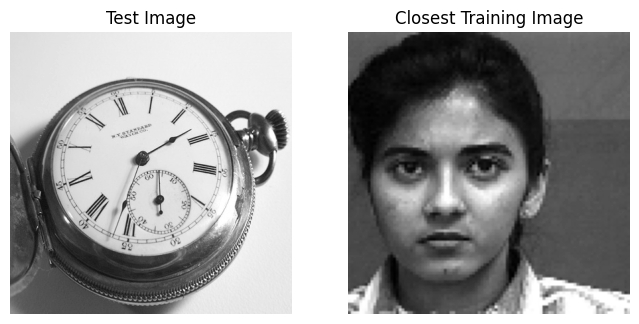

9275.419261394443


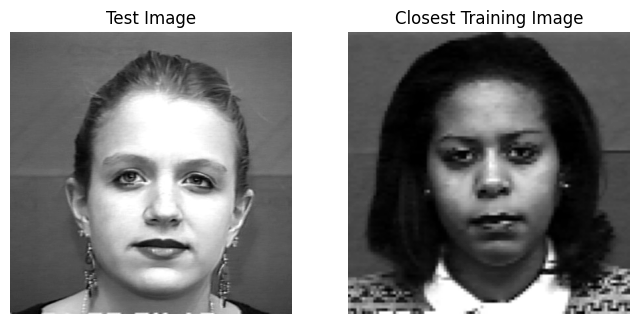

9838.79930612439


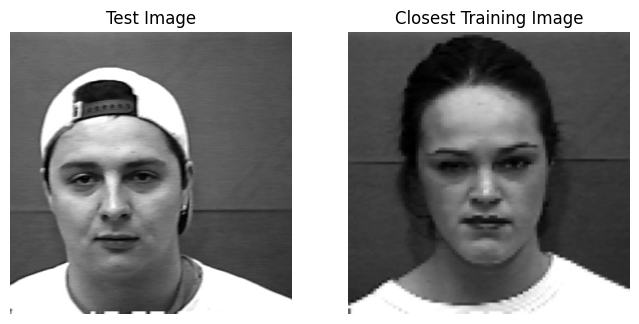

In [117]:
k = 15


results_table = []
for i, test_image in enumerate(test_images):
    sorted_indices = np.argsort(eigenvalues)[::-1]
    top_eigenvectors_k = eigenvectors[:, sorted_indices[:k]]
    weights, reconstructed_image = project_on_eigenvectors(test_image, mean_face, top_eigenvectors_k, k)
    closest_image = find_closest_image(reconstructed_image, resized_images)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(test_image, cmap="gray")
    plt.title("Test Image")
    plt.axis("off")
    if closest_image is not None:
        plt.subplot(1, 2, 2)
        plt.imshow(closest_image.reshape(100, 100), cmap="gray")
        plt.title("Closest Training Image")
        plt.axis("off")

    plt.show()

### Submission Guidelines:
1. Submit through Canvas your source code in a single .ipynb file. The name of the .ipynb file should be YourStudentID.ipynb
2. Import all the images from the ./Eigenfaces directory. Your TA will use the same directory name to grade your submission.
3. You don't need to attach the dataset with your submission.

Assignment Courtesy: Prof. Farhad Kamangar, CSE@UTA